# Udacity Nanaodegree Program "Self Driving Car Engineer"
## Vehicle Detection Project

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

I implemented pipeline to detect vehicles in an image respectivly a video stream in the IPython notebook VehicleDetection.ipynb.

The processing pipeline uses the histogram of oriented gradient and a support vector machine to detect the shapes of cars in the image.


## Histogram of Oriented Gradients (HOG)

The code for this step is contained in function `get_hog_features()` in code cell 3 of the IPython notebook "VehicleDetection.ipynb".

I started by reading all the `'car'` and `'notcar'` images. Here is an example of one of each of the `'car'` and the `'notcar'` classes together with their HOG.

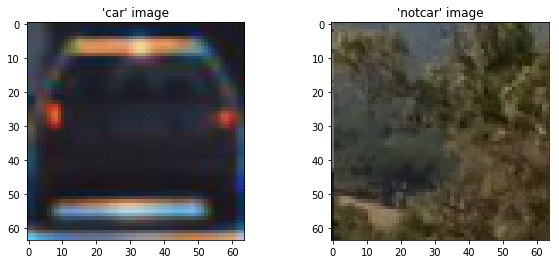

In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt 
%matplotlib inline

_, sub = plt.subplots(1, 2, figsize=(10,4))
sub[0].set_title("'car' image")
sub[0].imshow(mpimg.imread("output_images/10_orig.jpg"))

sub[1].set_title("'notcar' image")
sub[1].imshow(mpimg.imread("output_images/extra10_orig.jpg"))

## Selection of parameters and channels for HOG algorithm

I then explored different color spaces and different skimage.hog() parameters (`orientations`, `pixels_per_cell`, and `cells_per_block`).  I grabbed random images from each of the two classes and displayed them to get a feel for what the skimage.hog() output looks like.

I tried various combinations of parameters and decided to convert the image to the YCrCb color space and to use HOG parameter of orientations=9, pixels_per_cell=(8, 8) and cells_per_block=(2, 2).
(Refer to VehicleDetection.ipynb cell 5 lines 3 through 9.)

Here is an example:


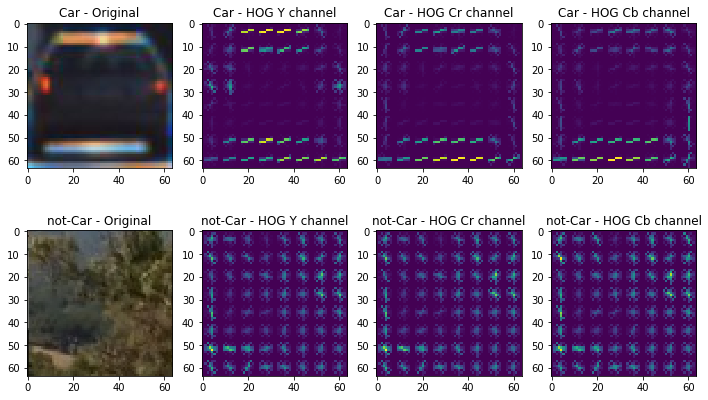

In [2]:
_, sub = plt.subplots(2, 4, figsize=(12,7))
sub[0,0].set_title("Car - Original")
sub[0,0].imshow(mpimg.imread("output_images/10_orig.jpg"))
sub[0,1].set_title("Car - HOG Y channel")
sub[0,1].imshow(mpimg.imread("output_images/10_hog_y.jpg"), cmap="gray")
sub[0,2].set_title("Car - HOG Cr channel")
sub[0,2].imshow(mpimg.imread("output_images/10_hog_cr.jpg"), cmap="gray")
sub[0,3].set_title("Car - HOG Cb channel")
sub[0,3].imshow(mpimg.imread("output_images/10_hog_cb.jpg"), cmap="gray")

sub[1,0].set_title("not-Car - Original")
sub[1,0].imshow(mpimg.imread("output_images/extra10_orig.jpg"))
sub[1,1].set_title("not-Car - HOG Y channel")
sub[1,1].imshow(mpimg.imread("output_images/extra10_hog_y.jpg"), cmap="gray")
sub[1,2].set_title("not-Car - HOG Cr channel")
sub[1,2].imshow(mpimg.imread("output_images/extra10_hog_cr.jpg"), cmap="gray")
sub[1,3].set_title("not-Car - HOG Cb channel")
sub[1,3].imshow(mpimg.imread("output_images/extra10_hog_cb.jpg"), cmap="gray")

## Training the classifier

I trained a linear SVM using about 10000 images of cars and roughly the same number of images not showing cars. 80% of the training data were used to train the classifier and 20% were used to test the classifier and to calculate its accuracy.
(Refer to VehicleDetection.ipynb cell 7.)

The accuracy of the linear SVM is 97.8%.

## Sliding window search 

### Implementation of the sliding window search

I expected cars at different scale in the image whereby the scale of the car depends on it position. All cars which are near to the camera will have a bigger scale in the images than cars beeing far away. The training images have a size of 64 by 64 pixels and so I have to scale the image in a way that the cars also have the same size. 
I decided to scale the image by a scaling factor ranging from 1.0 to 3.0 to search for cars. Because the road is located only in the lower half of the image, I decided to search for cars from y position 400 downwards. 
(Refer to VehicleDetection.ipynb cell 9 line 14 through 27.)

The images below show the search areas at different scales.

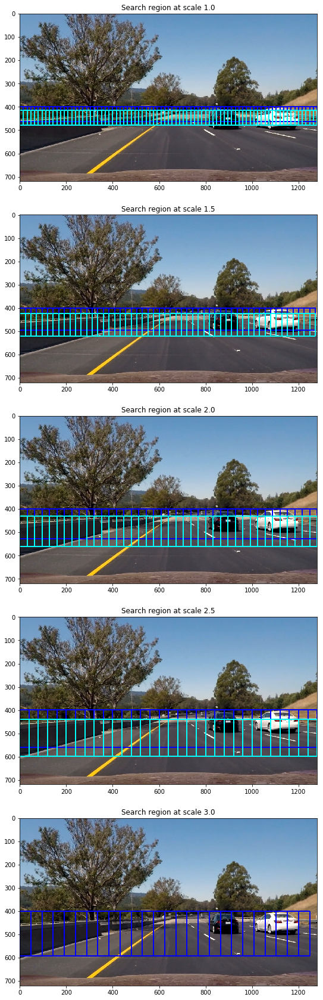

In [3]:
_, sub = plt.subplots(5, 1, figsize=(60,30))
sub[0].set_title("Search region at scale 1.0")
sub[0].imshow(mpimg.imread("output_images/scale_10.jpg"))
sub[1].set_title("Search region at scale 1.5")
sub[1].imshow(mpimg.imread("output_images/scale_15.jpg"))
sub[2].set_title("Search region at scale 2.0")
sub[2].imshow(mpimg.imread("output_images/scale_20.jpg"))
sub[3].set_title("Search region at scale 2.5")
sub[3].imshow(mpimg.imread("output_images/scale_25.jpg"))
sub[4].set_title("Search region at scale 3.0")
sub[4].imshow(mpimg.imread("output_images/scale_30.jpg"))

### Search examples

Ultimately I searched on five scales using YCrCb 3-channel HOG features in the feature vector, which provided a nice result.
(Refer to VehicleDetection.ipynb cell 8.)
Here are some example images:

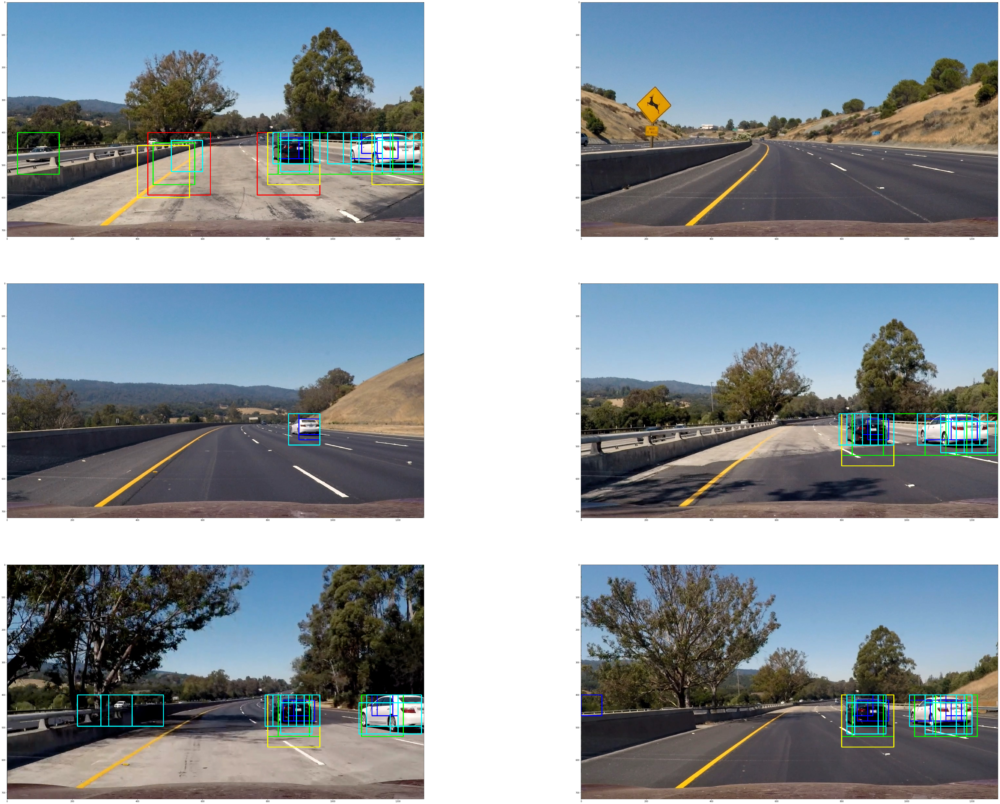

In [4]:
_, sub = plt.subplots(3, 2, figsize=(90,70))
sub[0,0].imshow(mpimg.imread("output_images/test1_boxes.jpg"))
sub[0,1].imshow(mpimg.imread("output_images/test2_boxes.jpg"))
sub[1,0].imshow(mpimg.imread("output_images/test3_boxes.jpg"))
sub[1,1].imshow(mpimg.imread("output_images/test4_boxes.jpg"))
sub[2,0].imshow(mpimg.imread("output_images/test5_boxes.jpg"))
sub[2,1].imshow(mpimg.imread("output_images/test6_boxes.jpg"))

### Combining the boxes and false positive filtering

The images above show that the search algorithm finds cars at multiple scales and produces overlapping boxes whith different sizes. The next step is to unify these boxes to one box per car. This is done by a "heat map" in which the number of boxes per pixel is added up. (Refer to VehicleDetection.ipynb cell 9 line 30 through 33.)

The images above also show that the search algorithm also produces boxes which do not belong to a car. These false positives are filtered out by applying a threshold to the heat map because at cars there are a lot of boxes at differect scales while false positives are found only at one scale.
(Refer to VehicleDetection.ipynb cell 9 line 40.)

The final step is to apply the function scipy.ndimage.measurements.label() to identify the surrounding rectangles of the found cars.
(Refer to VehicleDetection.ipynb cell 9 line 42.)

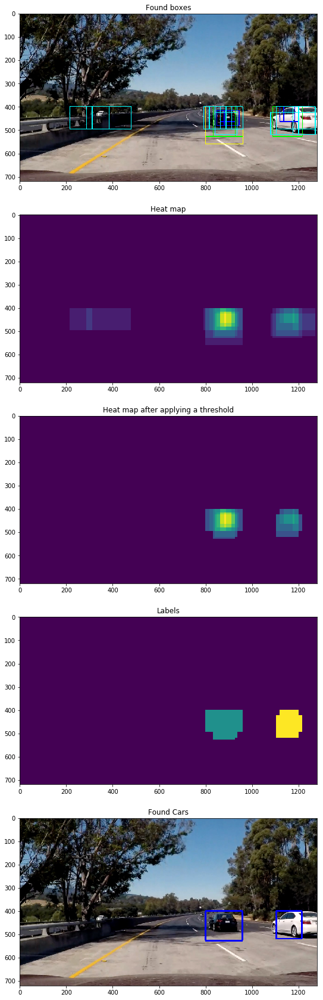

In [5]:
_, sub = plt.subplots(5, 1, figsize=(60,30))
sub[0].set_title("Found boxes")
sub[0].imshow(mpimg.imread("output_images/test5_boxes.jpg"))
sub[1].set_title("Heat map")
sub[1].imshow(mpimg.imread("output_images/test5_heatmap.jpg"), cmap="gray")
sub[2].set_title("Heat map after applying a threshold")
sub[2].imshow(mpimg.imread("output_images/test5_heatmap_thresh.jpg"))
sub[3].set_title("Labels")
sub[3].imshow(mpimg.imread("output_images/test5_labels.jpg"))
sub[4].set_title("Found Cars")
sub[4].imshow(mpimg.imread("output_images/test5_cars.jpg"))

## Video Implementation

Here is the link to my video result.

In [6]:
from IPython.display import HTML

In [7]:
%%HTML
<video width="320" height="240" controls>
  <source src="project_video_output.mp4" type="video/mp4">
</video>

### False positive filtering by smoothing the heat map

When processing the video the heat map is smoothed to reduce the false positives even further. The smoothing is done by adding the heat maps of the previous frames to the heat map of the current frame. Before adding the previous heat maps are multiplied by 0.5 to reduce the influence of previous heat maps the more the older the heat map. The resulting heat map will be:
`heatmap[0] += 0.5*heatmap[-1] + 0.25*heatmap[-2] + 0.125*heatmap[-3] + ...`

This filter is implemented in VehicleDetection.ipynb cell 9 line 35 through 37.

### False positive filtering by motion detection

Sometimes it is not enough to smooth the heat map and apply a threshold to it to filter out the false positives. When processing the video an additional filter is applied which accepts a search result only if it appears in 8 of 10 succeeding video frames and does not move from one frame to the next by more than 20 pixels.

This filter is implemented in VehicleDetection.ipynb cell 11 line 16 through 30.

## Discussion

This pipelines works well for the project video and uses some effective techniques to filter out false positives. The pipeline is able to process about 3 frames per second.

But, there is also room for improvement. 

- The search algorithm could use color histograms of colors and spatial binned colors additionally to the HOG features to improve the accuracy. But this would require to scale the the features which slows down the processing speed.
- The search areas could be restricted to search only the parts of the image showing the road. This would reduce the number of search windows for the small scale factors but the curvature of the road must be calculated before.
- A CNN could be used the detect the cars instead of the SVM. 
- The pipeline could be implemented in C or C++ to run faster.
- The pipeline could use multiple processor cores / a GPU to speed up the computation of e.g. the HOG features.

<video controls src="./project_video_output.mp4" />